In [1]:
import sys
sys.path.append('../..')
import numpy as np
from pysrc.clustering import MaxMinClustering
from pysrc.hbpamm import HBPAMM
from pysrc.model import GaussianMixtureModel
from pysrc.pamm import PAMM
from pysrc.plots import cluster_distribution_3D

In [2]:
REF_HB = np.array([0.82, 2.82, 2.74])

# Descriptor calculation

In [3]:
runner = HBPAMM(ta='O', td='O', th='H', cutoff=4.5, 
                weighted=True,
                box='12.4244, 12.4244, 12.4244, 90, 90, 90')

In [4]:
descriptors, weights, pairs = runner.run('h2o-blyp-piglet.xyz')

-2.30202112 4.25360095 2.69259933 0.02902873
-2.49967554 4.45125537 2.99197918 0.02463838
-0.62291489 2.57449472 2.56943865 0.06237020
-2.03362905 3.98520888 2.69176492 0.03162743
2.30202112 4.25360095 2.69259933 0.02902873
2.49967554 4.45125537 2.99197918 0.02463838
0.62291489 2.57449472 2.56943865 0.06237020
2.03362905 3.98520888 2.69176492 0.03162743
-0.57911912 2.72515528 2.69259933 0.05237393
-2.20858405 4.35462021 2.99197918 0.02372949
-2.01145112 4.15748728 2.56943865 0.02939776
-2.15007799 4.29611414 4.12508204 0.01752375
-2.20739964 4.35343580 2.69176492 0.02638558
0.57911912 2.72515528 2.69259933 0.05237393
2.20858405 4.35462021 2.99197918 0.02372949
2.01145112 4.15748728 2.56943865 0.02939776
2.15007799 4.29611414 4.12508204 0.01752375
2.20739964 4.35343580 2.69176492 0.02638558
-2.34226519 4.25225911 3.92866686 0.02020874
-1.57750709 3.48750102 3.46224074 0.02985593
-2.13815953 4.04815345 3.00762119 0.02813928
-2.19611792 4.10611184 2.71165105 0.03063656
2.34226519 4.252259

In [24]:
np.savez_compressed('h2o-blyp-piglet.npz', descriptors=descriptors[::10], weights=weights[::10])

# Grid point generation

In [6]:
ngrid = int(np.sqrt(len(descriptors)))

In [7]:
cluster = MaxMinClustering(ngrid, [26310])
cluster.fit(descriptors)
labels = cluster.predict(descriptors)

Output()

# Do PAMM

In [9]:
from pysrc.utils._pamm import localization

In [14]:
pamm.grid_weight

array([1.66449640e-02, 1.25907667e-04, 2.23177429e-04, 1.01125618e-04,
       6.40180842e-04, 5.96155624e-06, 1.65521962e-03, 1.67736485e-05,
       1.18518440e-03, 4.02569410e-05, 4.34599744e-04, 5.48780046e-04,
       9.27192145e-06, 1.61298596e-04, 2.15716656e-04, 1.45243346e-03,
       2.62959339e-04, 9.35557000e-05, 1.60563466e-04, 4.96130734e-05,
       3.53564154e-06, 4.92486161e-05, 6.15795726e-06, 2.40523008e-05,
       1.18287497e-04, 2.23462336e-04, 2.76289439e-04, 9.12098996e-06,
       1.60253925e-04, 1.91305563e-05, 1.65188093e-03, 1.38538923e-03,
       7.21650038e-03, 2.35346027e-04, 4.41503880e-05, 2.13181847e-04,
       1.82482164e-05, 1.28615640e-03, 2.07235594e-04, 1.51466981e-04,
       1.23574132e-04, 1.17530908e-02, 4.35135418e-05, 3.95919863e-05,
       3.11175320e-05, 3.40559468e-04, 1.02039643e-03, 3.40397614e-05,
       4.54583634e-04, 1.54425854e-05, 2.98148048e-03, 2.00910965e-04,
       8.40869655e-03, 1.07122524e-03, 7.03748761e-04, 9.75368536e-04,
      

In [12]:
pamm.grid_pos - pamm.grid_pos[0]

array([[ 0.        ,  0.        ,  0.        ],
       [ 3.80540468,  1.41862883,  1.50906863],
       [-1.74140349,  1.48050866,  1.57624213],
       ...,
       [ 3.35637638,  1.32902342,  0.47168335],
       [ 3.13734861,  1.32659023,  0.70820898],
       [ 1.17940991, -0.63655162, -0.53000364]])

In [10]:
localization(pamm.period, pamm.grid_pos, pamm.grid_pos[0], pamm.grid_weight, 4.0323262)

(array([1.66449640e-02, 1.22803016e-05, 8.58048715e-05, 4.51011160e-05,
        3.85757817e-04, 3.60760757e-06, 1.03534851e-03, 5.73323096e-06,
        1.71633889e-04, 2.98114463e-05, 1.62668217e-04, 4.30637882e-04,
        5.74579350e-06, 1.38320120e-04, 5.03757229e-05, 4.74601122e-04,
        2.29754794e-04, 6.87926901e-05, 7.96334201e-05, 2.82599080e-05,
        2.18898444e-06, 2.27513036e-05, 4.93358471e-06, 2.18633019e-05,
        9.93991272e-05, 2.77590379e-05, 7.83501206e-05, 5.74148211e-06,
        1.17679884e-04, 3.94053950e-06, 1.14687063e-03, 7.08457970e-04,
        4.20083732e-03, 5.37658705e-05, 1.44810698e-05, 2.00776988e-04,
        1.60137384e-05, 9.94521261e-04, 3.84537254e-05, 6.51170888e-05,
        8.84513662e-05, 1.12003747e-02, 2.10473792e-05, 1.54730829e-05,
        1.76065871e-05, 2.88620192e-04, 2.25574792e-04, 1.75866084e-05,
        3.22444911e-04, 1.16938481e-05, 2.30527752e-03, 6.38447260e-05,
        5.75695235e-03, 1.02869170e-03, 2.36043498e-04, 2.085335

In [8]:
pamm = PAMM(descriptors, dimension=3, ngrid=ngrid, sample_weight=weights)
result = pamm.fit(cluster.selected_idx_)

Output()

Global eff. dim. 1.6976770119107123
[4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262 4.0323262
 4.0323262 4.0323262 4.0323262 4.0323262 

Output()

[1.19946792e-02 1.42820582e-05 1.53456940e-04 4.57572127e-05
 4.76176330e-04 5.36480352e-06 5.24610340e-04 7.57225490e-06
 1.58836398e-04 3.43178001e-05 1.24412605e-04 4.76125914e-04
 6.79602210e-06 6.88268575e-05 5.66047148e-05 3.50293379e-04
 2.09965166e-04 9.30178219e-05 1.21370848e-04 4.52149994e-05
 1.68470039e-06 2.34367596e-05 5.64842521e-06 2.15373406e-05
 6.33393541e-05 2.84791670e-05 7.78941722e-05 6.12507857e-06
 1.42749852e-04 4.99969921e-06 1.49333390e-03 4.28300782e-04
 6.11410296e-03 4.62468528e-05 1.43560894e-05 1.74221379e-04
 1.68465230e-05 1.00946257e-03 3.70875937e-05 5.48715671e-05
 1.20257940e-04 7.06855191e-03 2.58888372e-05 1.02990907e-05
 1.75496338e-05 3.19056757e-04 1.75696024e-04 1.46891779e-05
 4.34901202e-04 1.27908429e-05 1.18302700e-03 7.76278338e-05
 3.68663946e-03 5.93437968e-04 2.23401494e-04 1.87475052e-04
 6.55358495e-06 1.82034663e-04 2.53010607e-04 1.82140179e-05
 2.73769170e-04 1.40506669e-06 5.26837002e-05 9.15389686e-04
 1.10124886e-04 6.491785

Output()

In [24]:
descriptors[cluster.selected_idx_]

array([[-0.98906118,  3.01690619,  2.87464963],
       [ 2.8163435 ,  4.43553502,  4.38371826],
       [-2.73046466,  4.49741485,  4.45089175],
       ...,
       [ 2.3673152 ,  4.34592961,  3.34633298],
       [ 2.14828743,  4.34349642,  3.5828586 ],
       [ 0.19034874,  2.38035457,  2.34464599]])

In [8]:
result.bootstrap(3)

Output()

6 cluster centers


Output()

6 cluster centers


Output()

6 cluster centers


array([[2., 4., 0., ..., 4., 4., 3.],
       [2., 4., 0., ..., 4., 4., 3.],
       [2., 4., 0., ..., 4., 4., 3.]])

# Results

In [9]:
result.cluster_attributes

,labels,probs,pabserr,prelerr,sigma2,flocal,weights,local_dimension,h_trace_normed
0,147,0.257454,1.153849,0.896396,0.392397,0.150001,0.016645,1.718812,0.003655
1,331,-5.736234,-4.801311,0.934922,1.390788,0.149998,0.000126,2.202260,0.006310
2,32,-3.598635,-2.690323,0.908313,1.440011,0.150002,0.000223,2.212838,0.006576
3,427,-5.937209,-4.959035,0.978175,0.815836,0.150001,0.000101,1.893365,0.008684
4,119,-5.050049,-3.805981,1.244067,0.297490,0.150000,0.000640,2.629525,0.001641
...,...,...,...,...,...,...,...,...,...
516,119,-2.648827,-1.761245,0.887582,0.207012,0.149998,0.001614,2.624552,0.001407
517,223,-1.648010,-0.726563,0.921448,0.423531,0.150003,0.001455,1.391384,0.003880
518,331,-1.515115,-0.592016,0.923100,0.278447,0.150000,0.001883,2.056996,0.002943
519,331,-1.729729,-0.816785,0.912944,0.358557,0.150001,0.001951,2.061969,0.003667


## Grid information

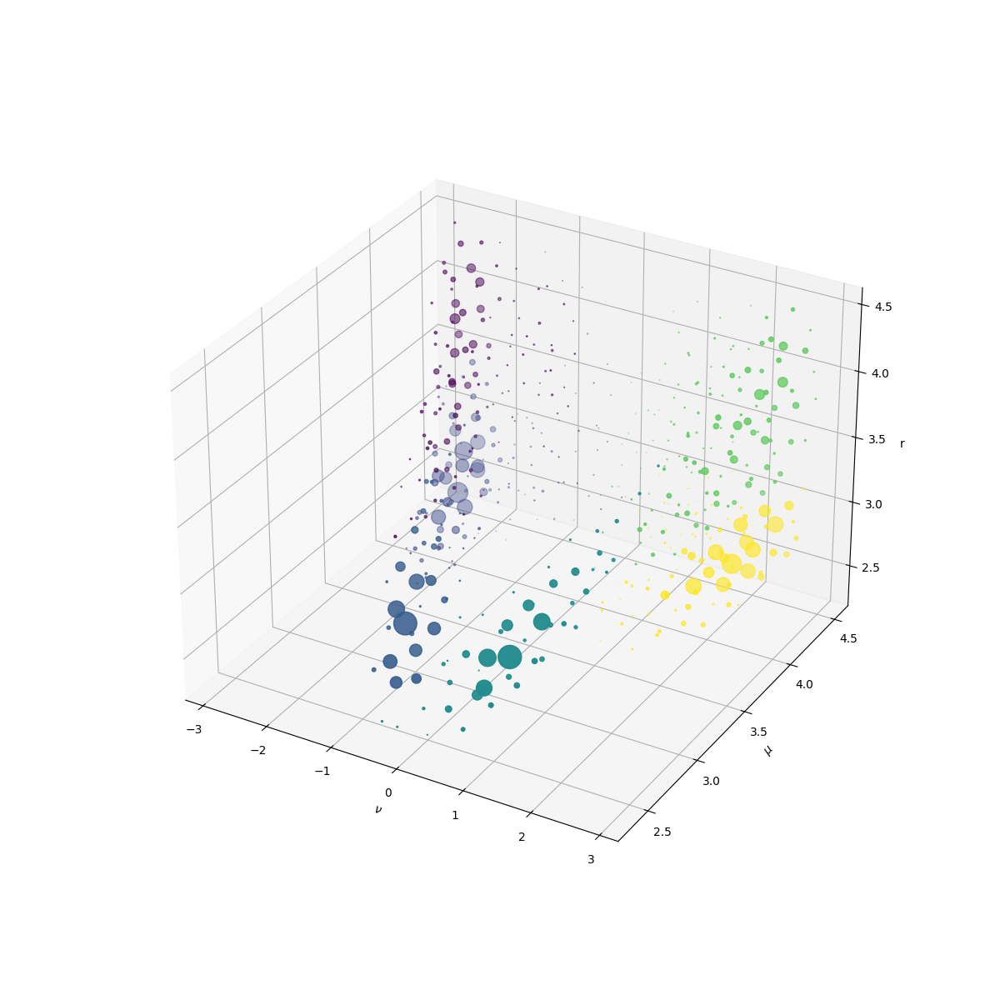

In [10]:
%matplotlib ipympl
fig, ax = cluster_distribution_3D(pamm, label_text=[r'$\nu$', r'$\mu$', r'r'])

In [11]:
gaussian_weights, gaussian_means, gaussian_cov = pamm.generate_probability_model()

In [12]:
hb_cluster = np.argmin(np.linalg.norm(gaussian_means - REF_HB, axis=1))

print(f'The {hb_cluster}th cluster is the cluster closest to the HB reference')

The 3th cluster is the cluster closest to the HB reference


In [13]:
p = GaussianMixtureModel(gaussian_weights, gaussian_means, gaussian_cov)
probs = np.array([p(x, hb_cluster) for x in descriptors])

In [14]:
def split_into_frames(arr, seperate):
    return [arr[seperate[i]:seperate[i+1]] for i in range(len(seperate) - 1)]

def get_s(probs_in_frame, pairs):
    sa = []
    sd = []
    sh = []
    for i, frame in enumerate(pairs):
        idxs = np.array(frame)
        hs = np.unique(idxs[:, 0])
        acceptors = np.unique(idxs[:, 1])
        donors = np.unique(idxs[:, 2])
        for h in hs:
            sh.append(np.sum(probs_in_frame[i][idxs[:, 0] == h]))
        for acceptor in acceptors:
            sa.append(np.sum(probs_in_frame[i][idxs[:, 1] == acceptor]))
        for donor in donors:
            sd.append(np.sum(probs_in_frame[i][idxs[:, 2] == donor]))
    sh = np.array(sh)
    sa = np.array(sa)
    sd = np.array(sd)

    return sh, sa, sd

In [15]:
seperate = [0]
for frame in pairs:
    seperate.append(seperate[-1] + len(frame))

In [16]:
probs_in_frame = split_into_frames(probs, seperate)

In [17]:
sh, sa, sd = get_s(probs_in_frame, pairs)

Text(0.5, 0, '$S_D$')

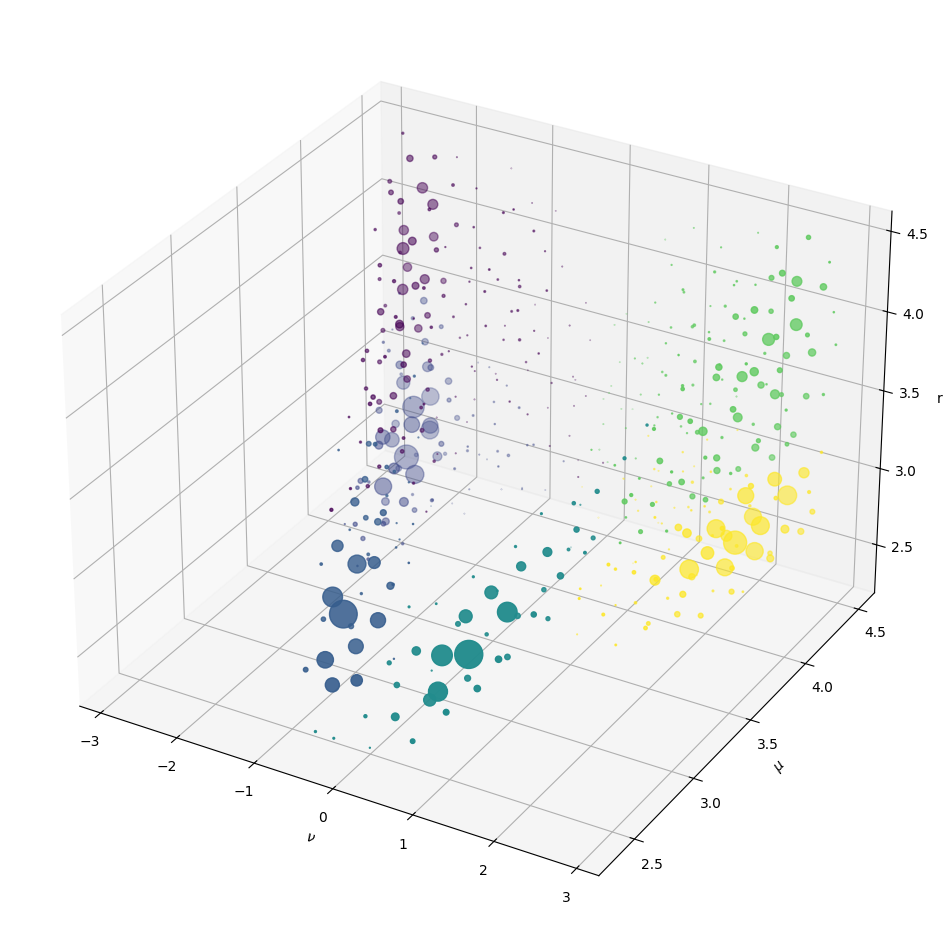

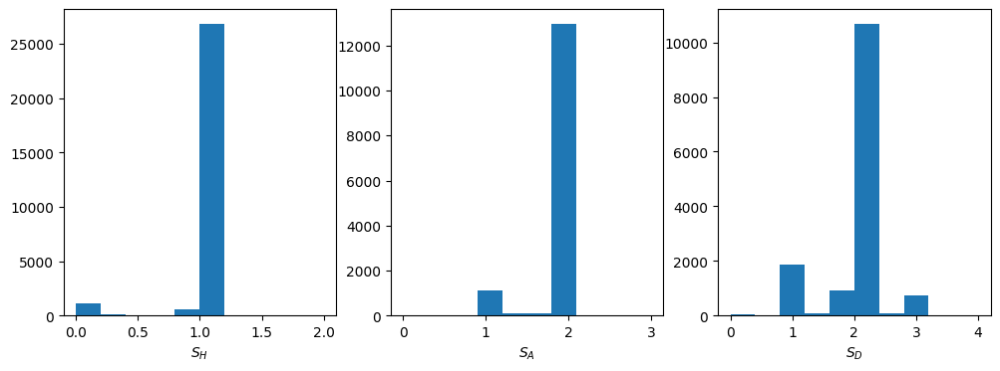

In [18]:
import matplotlib.pyplot as plt
%matplotlib inline
fig, ax = plt.subplots(ncols=3, figsize=(12, 4))
ax[0].hist(sh)
ax[1].hist(sa)
ax[2].hist(sd)
ax[0].set_xlabel('$S_H$')
ax[1].set_xlabel('$S_A$')
ax[2].set_xlabel('$S_D$')